## **Tutorial of fetching the multi-modal Sentinel imagery From Google Earth Engine (or GEE)**

Hello! I'm currently an undergraduate at DNUI, also a research assistant of
lecture for Data Processing, Data Visualization & Full-Stack Dvp etc.


Personal CV illustration could be visited at https://sylvestervan.github.io

From Mid-last June, 2025, I determine to initializing my very first individual scientific research (field of AI for Science) and optimising the mechanism of earth2 by NVIDIA[1][2][3].

Due to the acessiability of Google Earth Engine(gee), I would like to open source the process of fetching imagery which is an irreplacable step of my entire workflow. All you need to do is to choose the different method from the code block described below.

*   Method 1: Via Google Drive to pull request, enter task manage page of gee, save cache to your drive, then download from it. (NEED: **ENOUGH SPACE** in google drive and high pixels required. If you had have some decent space, I highly recommend it because of its superb simplicity and quality)
*   Method 2: Via Colab(or any third party notebook), save cache to online storage enviroment and download or directly run at localhost or virtual machines. (NEED: mid or low pixels are adaptable. great accessiability for **NOT ENOUGH SPACE** at google drive or LOW-RANGE ML, DL, CNN, etc. training. To exemplify, graduation thesis, practical project.)

More Official Tutorial at https://developers.google.com/earth-engine/guides

*Happy and Enjoy Coding :)*

<br>[1] GitHub: &thinsp;https://github.com/NVIDIA/earth2studio

[2] Page:&emsp;&thinsp;https://nvidia.github.io/earth2studio/index.html

[3] NVIDIA: https://www.nvidia.com/en-us/high-performance-computing/earth-2/

个人简历可访问 https://sylvestervan.github.io

由于谷歌地球引擎（gee）面对所有人开放，我想将获取图像的过程开源，这是我整个工作流程中不可或缺的一步。你只需从下面描述的代码块中选择不同的方法即可。

* 方法 1：通过 Google Drive 拉取请求，进入 gee 的任务管理页面，将缓存保存到硬盘，然后从中下载。需要**谷歌硬盘空间充足**，像素要求高。如果你有足够的空间，我强烈推荐你使用它，因为它非常简单，而且质量上乘。
* 方法 2：通过 Colab（或任何第三方笔记本），将缓存保存到在线存储环境，然后下载或直接在本地主机或虚拟机上运行。(需要：中像素或低像素均可。对于**谷歌硬盘空间不足**或低范围 ML、DL、CNN 等训练而言，具有极大的可操作性。以毕业论文、实践项目为例）。

更多官方教程，请访问 https://developers.google.com/earth-engine/guides?hl=zh-cn

编码愉快 :)

In association of Dalian Neusoft University of Information, Data Supported by CDSE, Copernicus.

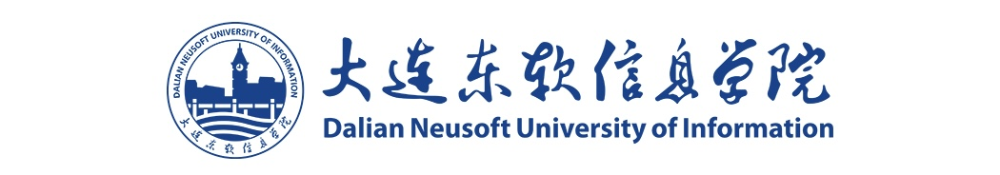

logonew.svg

SWIS-logo-Copernicus.svg

SWIS-logo-EU-comission.svg

SWIS-logo-ESA.svg

Satelite Supported By:

<br>

*   Sentinel-1

<br>

SENTINEL_1.svg

<br>

*   Sentinel-2

<br>

SENTINEL_2.svg

## **Universal Setting: GEE Authorization**

⚠ NOTICE: Essentials before workflow, or could not visit gee.

In [ ]:
!pip install -q earthengine-api --upgrade

In [ ]:
import ee

replace your own project name **ID**, if you are not acquire one, go apply one with **GEE api service abled**.

In [ ]:
ee.Authenticate()
ee.Initialize(project='geoscidl2025')  # here is my project id. DO NOT TRY TO LOGIN OR USE

### *Method 1: Pull requests and Deploy tasks at Google Earth Engine. (RUN ON CLOUD)*

In [ ]:
# Pull Request to GEE(Google Earth Engine) Cloud Platform.

In [ ]:
CITY_NAME = 'STOCKHOLM'
LAT_CENTER = 59.3293
LON_CENTER = 18.0686

# 以中心点为基准，经纬度分别加减0.25度来定义研究区域
AOI_BUFFER = 0.25
GEOMETRY = ee.Geometry.Rectangle(
    [
        LON_CENTER - AOI_BUFFER,
        LAT_CENTER - AOI_BUFFER,
        LON_CENTER + AOI_BUFFER,
        LAT_CENTER + AOI_BUFFER
    ]
)

# --- 时间范围 ---
START_DATE = '2024-06-18'
END_DATE = '2025-06-18'

# --- 导出设置 ---
DRIVE_FOLDER_NAME = 'GEE_Final_Exports' # 导出的文件将保存在您Google Drive的这个文件夹下
SCALE = 10  # 图像分辨率 (米)，10米是哨兵卫星的高清分辨率

In [ ]:
try:
    # 请确保这里填写您自己的GEE项目ID
    ee.Initialize(project='geoscidl2025')
    print(f"--- 成功初始化地球引擎 ---")
    print(f"--- 准备导出城市: {CITY_NAME} ---")
    print(f"--- 时间范围: {START_DATE} to {END_DATE} ---")
except Exception as e:
    print(f"错误：初始化地球引擎失败。请确保您已完成授权。")
    print(e)

--- 成功初始化地球引擎 ---
--- 准备导出城市: STOCKHOLM ---
--- 时间范围: 2024-06-18 to 2025-06-18 ---


In [ ]:
s2_collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                  .filterBounds(GEOMETRY)
                  .filterDate(START_DATE, END_DATE))
print(f"  - 查询到 {s2_collection.size().getInfo()} 张 Sentinel-2 影像。")

# --- 查询哨兵1号 (Sentinel-1) 数据 ---
# 注意：根据您的要求，这里不进行斑点噪声滤波。
s1_collection = (ee.ImageCollection('COPERNICUS/S1_GRD')
                 .filterBounds(GEOMETRY)
                 .filterDate(START_DATE, END_DATE)
                 .filter(ee.Filter.eq('instrumentMode', 'IW'))) # 标准的IW模式
print(f"  - 查询到 {s1_collection.size().getInfo()} 张 Sentinel-1 影像。")

  - 查询到 801 张 Sentinel-2 影像。
  - 查询到 289 张 Sentinel-1 影像。


In [ ]:
s1_stack = s1_collection.select(['VV', 'VH']).toBands()
s2_stack = s2_collection.select(['B2', 'B3', 'B4', 'B8']).toBands() # 选择蓝、绿、红、近红外四个常用波段

In [ ]:
# --- 准备并启动 Sentinel-1 导出任务 ---
s1_task_description = f'S1_{CITY_NAME}_{START_DATE}_to_{END_DATE}'
print(f"\n  - 准备导出任务: {s1_task_description}")

s1_task = ee.batch.Export.image.toDrive(
    image=s1_stack,
    description=s1_task_description,
    folder=DRIVE_FOLDER_NAME,
    fileNamePrefix=s1_task_description,
    region=GEOMETRY,
    scale=SCALE,
    fileFormat='GeoTIFF',
    maxPixels=1e13  # 提高像素上限以处理大规模导出
)
s1_task.start()
print(f"  -> Sentinel-1 导出任务已成功提交。")


  - 准备导出任务: S1_STOCKHOLM_2024-06-18_to_2025-06-18
  -> Sentinel-1 导出任务已成功提交。


In [ ]:
# --- 准备并启动 Sentinel-2 导出任务 ---
s2_task_description = f'S2_{CITY_NAME}_{START_DATE}_to_{END_DATE}'
print(f"\n  - 准备导出任务: {s2_task_description}")

s2_task = ee.batch.Export.image.toDrive(
    image=s2_stack,
    description=s2_task_description,
    folder=DRIVE_FOLDER_NAME,
    fileNamePrefix=s2_task_description,
    region=GEOMETRY,
    scale=SCALE,
    fileFormat='GeoTIFF',
    maxPixels=1e13
)
s2_task.start()
print(f"  -> Sentinel-2 导出任务已成功提交。")


  - 准备导出任务: S2_STOCKHOLM_2024-06-18_to_2025-06-18
  -> Sentinel-2 导出任务已成功提交。


In [ ]:
print("\n==============================================================================")
print("所有任务均已提交至Google Earth Engine。您的本地脚本任务已完成！")
print("\n下一步操作：")
print("1. 打开浏览器，访问 Google Earth Engine 代码编辑器: https://code.earthengine.google.com/")
print("2. 在页面右上角，点击 'Tasks' (任务) 标签页。")
print("3. 您会看到两个刚刚提交的、灰色的任务。")
print("4. 请手动点击每个任务右侧蓝色的 'RUN' 按钮来启动它们。")
print("\n任务将在云端后台运行，完成后，文件会自动保存在您的Google Drive中。")
print("==============================================================================")


所有任务均已提交至Google Earth Engine。您的本地脚本任务已完成！

下一步操作：
1. 打开浏览器，访问 Google Earth Engine 代码编辑器: https://code.earthengine.google.com/
2. 在页面右上角，点击 'Tasks' (任务) 标签页。
3. 您会看到两个刚刚提交的、灰色的任务。
4. 请手动点击每个任务右侧蓝色的 'RUN' 按钮来启动它们。

任务将在云端后台运行，完成后，文件会自动保存在您的Google Drive中。


### *Method 2: Fetch imagery directly via getURL (RUN ON ACTUAL ENV)*

⚠ WARNING: Parameters [e.g. PATH, CITY, TIME, DATE, etc.] mentioned in the following part require double-checked before actually run the block. strongly recommended.

In [ ]:
# Request Locally to fetch dataset.

In [ ]:
!pip install earthengine-api geemap tqdm --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.9 MB/s eta 0:00:00


In [2]:
import ee
import geemap
import os
import requests
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import numpy as np
from io import BytesIO
import shutil

replace your project id here

In [3]:
ee.Authenticate()
ee.Initialize(project='geoscidl2025')
print("--- Environment setup complete ---")

--- Environment setup complete ---


In [29]:
# --- User Settings ---

CITY_NAME = "geneva"
PREVIEW_START_DATE = "2024-09-01"
PREVIEW_END_DATE = "2024-12-10"
DOWNLOAD_START_DATE = "2024-09-01"
DOWNLOAD_END_DATE = "2024-12-10"

print(f"--- Settings for <{CITY_NAME}>, preview period: {PREVIEW_START_DATE} to {PREVIEW_END_DATE} ---")
print(f'download from {DOWNLOAD_START_DATE} to {DOWNLOAD_END_DATE}.')

# --- End of Settings ---

# Geocode the city to get its coordinates

try:
    city_coords = geemap.geocode(CITY_NAME)
    lon, lat = city_coords[1], city_coords[0]
    # Define Region of Interest (ROI) as a 0.5x0.5 degree box
    roi = ee.Geometry.Rectangle([lon - 0.25, lat - 0.25, lon + 0.25, lat + 0.25])
    print(f"Successfully located {CITY_NAME} at (Lat: {lat:.4f}, Lon: {lon:.4f})")
except Exception as e:
    print(f"Could not geocode city: {CITY_NAME}. Please define coordinates manually.")
    lon, lat = 6.1432, 46.2044
    roi = ee.Geometry.Rectangle([lon - 0.25, lat - 0.25, lon + 0.25, lat + 0.25])
    print(f"\nUsing default coordinates: Lon: {lon:.4f}, Lat: {lat:.4f}\n")
    print(roi)

# Create the main directory for storing downloaded GeoTIFF files

DATASET_PATH = f"/content/dataset/{CITY_NAME.replace(' ', '_')}"
os.makedirs(DATASET_PATH, exist_ok=True)
print(f"\nDataset directory created at: {DATASET_PATH}")

--- Settings for <geneva>, preview period: 2024-09-01 to 2024-12-10 ---
download from 2024-09-01 to 2024-12-10.
Could not geocode city: geneva. Please define coordinates manually.

Using default coordinates: Lon: 6.1432, Lat: 46.2044

ee.Geometry({
  "functionInvocationValue": {
    "functionName": "GeometryConstructors.Polygon",
    "arguments": {
      "coordinates": {
        "constantValue": [
          [
            [
              5.8932,
              46.4544
            ],
            [
              5.8932,
              45.9544
            ],
            [
              6.3932,
              45.9544
            ],
            [
              6.3932,
              46.4544
            ]
          ]
        ]
      },
      "evenOdd": {
        "constantValue": true
      }
    }
  }
})

Dataset directory created at: /content/dataset/geneva


ONLINE PREVIEW: Recommended before fetch to local.

In [6]:
# Online Preview

def plot_image_collection_grid(collection, vis_params, title):
    """Fetches and plots up to 10 images from a collection in a 2x5 grid."""
    image_list = collection.toList(10)
    image_count = min(10, image_list.size().getInfo())

    if image_count == 0:
        print(f"No images found for '{title}' in the specified date range and region.")
        return

    fig, axes = plt.subplots(2, 5, figsize=(20, 8))
    axes = axes.flatten()
    fig.suptitle(title, fontsize=18, y=1.02)

    for i in range(image_count):
        ee_image = ee.Image(image_list.get(i))
        image_id = ee_image.id().getInfo()

        # Get a thumbnail URL for visualization
        thumbnail_url = ee_image.visualize(**vis_params).getThumbURL({
            'dimensions': 256, 'region': roi, 'format': 'png'
        })

        # Fetch and display the image
        try:
            response = requests.get(thumbnail_url)
            response.raise_for_status()
            img = plt.imread(BytesIO(response.content), format='png')

            ax = axes[i]
            ax.imshow(img)
            ax.set_title(image_id, fontsize=9)
            ax.set_xlabel("Longitude")
            ax.set_ylabel("Latitude")
            ax.set_xticks([])
            ax.set_yticks([])

        except requests.exceptions.RequestException as e:
            ax = axes[i]
            ax.text(0.5, 0.5, "Failed to load thumbnail", ha='center', va='center')
            ax.set_title(image_id, fontsize=9, color='red')

    # Hide any unused subplots
    for j in range(image_count, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

Found 50 Sentinel-1 images in the specified time range and region for preview.


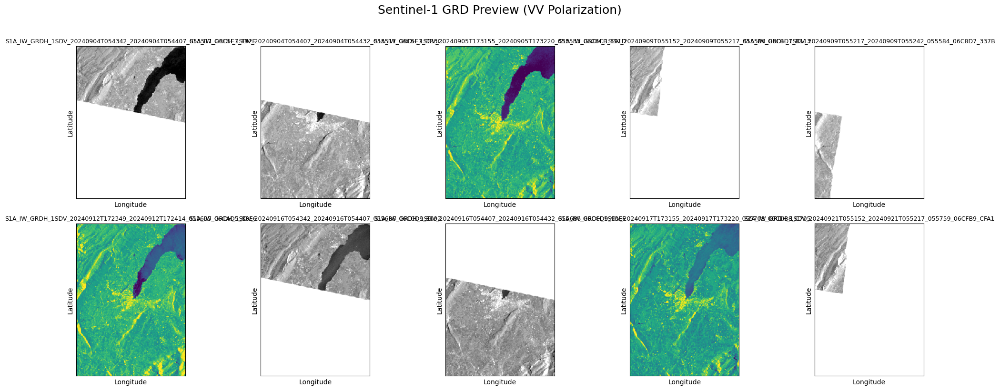

In [7]:
# --- Sentinel-1 Image Preview ---
s1_collection_preview = (ee.ImageCollection('COPERNICUS/S1_GRD')
                         .filterBounds(roi)
                         .filterDate(PREVIEW_START_DATE, PREVIEW_END_DATE)
                         .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV')))

# Get and print the number of available images
s1_image_count = s1_collection_preview.size().getInfo()
print(f"Found {s1_image_count} Sentinel-1 images in the specified time range and region for preview.")

# Visualization parameters for Sentinel-1 (VV polarization)
s1_vis_params = {'bands': ['VV'], 'min': -25, 'max': 0}

# Proceed to plot only if images were found
if s1_image_count > 0:
    plot_image_collection_grid(s1_collection_preview, s1_vis_params, "Sentinel-1 GRD Preview (VV Polarization)")

Found 15 Sentinel-2 images (with <25% cloud cover) in the specified time range and region for preview.


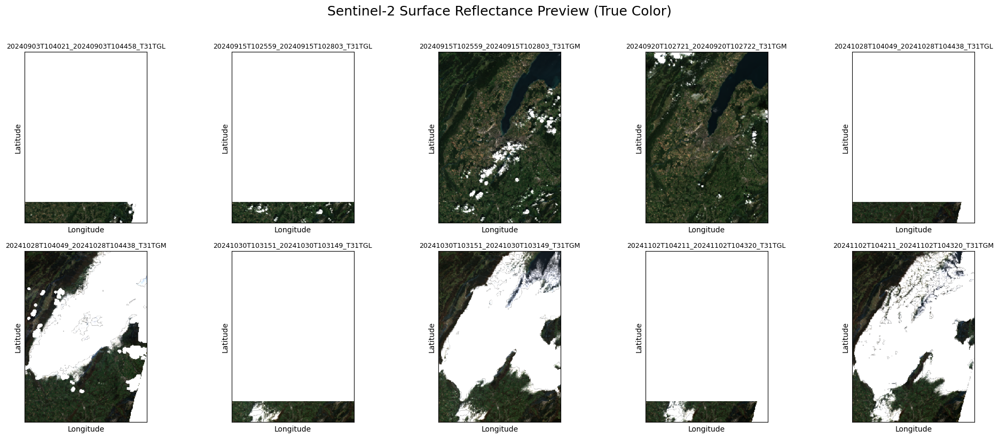

In [8]:
# --- Sentinel-2 Image Preview ---
def mask_s2_clouds(image):
    """A simple cloud masking function for Sentinel-2 SR images."""
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000).copyProperties(image, ["system:time_start"])

s2_collection_preview = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                         .filterBounds(roi)
                         .filterDate(PREVIEW_START_DATE, PREVIEW_END_DATE)
                         .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 25))
                         .map(mask_s2_clouds))

# Get and print the number of available images
s2_image_count = s2_collection_preview.size().getInfo()
print(f"Found {s2_image_count} Sentinel-2 images (with <25% cloud cover) in the specified time range and region for preview.")

# Visualization parameters for Sentinel-2 (True Color)
s2_vis_params = {'bands': ['B4', 'B3', 'B2'], 'min': 0.0, 'max': 0.3}

# Proceed to plot only if images were found
if s2_image_count > 0:
    plot_image_collection_grid(s2_collection_preview, s2_vis_params, "Sentinel-2 Surface Reflectance Preview (True Color)")

In [16]:
# --- New Plotting Function for Comparing Composite Images ---

def plot_composite_panel(images, titles, vis_params_list, grid_dims=(1, 4)):
    """
    Plots a panel of single, composited GEE images for direct comparison.
    (Corrected to handle both single and multiple image plots)
    """
    if not images:
        print("No images to display.")
        return

    num_images = len(images)
    rows, cols = grid_dims
    # This line creates the figure and axes objects
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5.5, rows * 5))

    # --- CORRECTION ---
    # When creating a 1x1 subplot, 'axes' is a single object, not an array.
    # We use np.atleast_1d() to ensure it's always an array. This makes the
    # function robust for any grid size, including 1x1.
    axes = np.atleast_1d(axes).flatten()
    # --- END CORRECTION ---

    for i in range(num_images):
        ax = axes[i]
        try:
            ee_image = images[i]
            title = titles[i]
            vis_params = vis_params_list[i]

            # Get thumbnail URL
            thumbnail_url = ee_image.visualize(**vis_params).getThumbURL({
                'dimensions': 384, 'region': roi, 'format': 'png'
            })

            # Fetch and display
            response = requests.get(thumbnail_url)
            response.raise_for_status()
            img_data = response.content
            img = plt.imread(BytesIO(img_data), format='png')

            ax.imshow(img)
            ax.set_title(title, fontsize=12)
            ax.set_axis_off()

        except Exception as e:
            # This will now correctly display errors on the subplot
            ax.text(0.5, 0.5, f"Error loading thumbnail:\n{e}",
                    ha='center', va='center', color='red', fontsize=9)
            if i < len(titles):
                 ax.set_title(titles[i], fontsize=12, color='red')
            ax.set_axis_off()

    # Hide any unused subplots
    for j in range(num_images, len(axes)):
        axes[j].set_axis_off()

    plt.tight_layout(pad=1.5)
    plt.show()

Generating Sentinel-1 preview panel for 2024-09-01 to 2024-12-10...


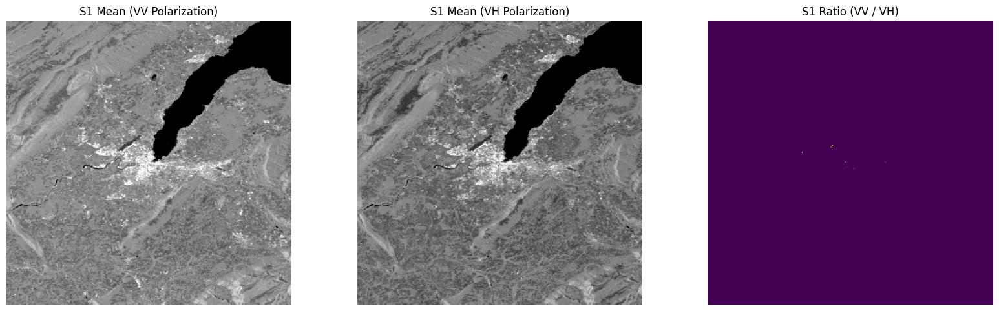

In [17]:
# --- Sentinel-1 Composite Preview (VV, VH, and Ratio) ---

# 1. Define the collection for the preview period
# We filter for images that have both VV and VH polarizations available.
s1_collection_preview = (ee.ImageCollection('COPERNICUS/S1_GRD')
                         .filterBounds(roi)
                         .filterDate(PREVIEW_START_DATE, PREVIEW_END_DATE)
                         .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
                         .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH')))

# 2. Create a single, mean composite image over the period
# This averages all available images into one for a stable view.
s1_composite = s1_collection_preview.select(['VV', 'VH']).mean()

# 3. Create separate image objects for each polarization and the ratio
# Isolate the VV band for individual display (grayscale)
vv_band = s1_composite.select('VV')
# Isolate the VH band for individual display (grayscale)
vh_band = s1_composite.select('VH')
# Calculate the VV/VH Ratio (colorized)
vv_vh_ratio = vv_band.divide(vh_band)

print(f"Generating Sentinel-1 preview panel for {PREVIEW_START_DATE} to {PREVIEW_END_DATE}...")

# 4. Prepare lists for the plotting function
images_to_plot = [vv_band, vh_band, vv_vh_ratio]

titles_to_plot = [
    'S1 Mean (VV Polarization)',
    'S1 Mean (VH Polarization)',
    'S1 Ratio (VV / VH)'
]

# Define visualization parameters for each of the three images
vis_params_to_plot = [
    # Visualization for VV (grayscale). This band is sensitive to surface roughness.
    {'min': -20, 'max': 0, 'palette': ['#000000', '#FFFFFF']},

    # Visualization for VH (grayscale). This band is sensitive to volume scattering (e.g., vegetation).
    {'min': -25, 'max': -5, 'palette': ['#000000', '#FFFFFF']},

    # Visualization for the ratio (color). This can amplify subtle differences between the bands.
    # We use the 'viridis' color palette for scientific visualization.
    {'min': 1, 'max': 6, 'palette': ['#440154', '#3b528b', '#21918c', '#5ec962', '#fde725']}
]

# 5. Plot the three images in a single row (1x3 grid)
plot_composite_panel(
    images=images_to_plot,
    titles=titles_to_plot,
    vis_params_list=vis_params_to_plot,
    grid_dims=(1, 3)
)

Generating Sentinel-1 Radar Ratio composite preview for 2024-09-01 to 2024-12-10...


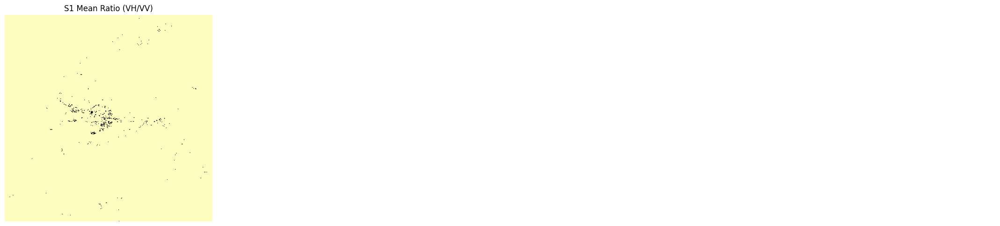

In [18]:
# --- Sentinel-1 Composite Preview (Radar Ratio) ---

# Define the collection for the preview period
s1_collection_preview = (ee.ImageCollection('COPERNICUS/S1_GRD')
                         .filterBounds(roi)
                         .filterDate(PREVIEW_START_DATE, PREVIEW_END_DATE)
                         .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
                         .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH')))

# Create a single, mean composite image over the period
s1_composite = s1_collection_preview.select(['VV', 'VH']).mean()

# Calculate the VH/VV Ratio
# Adding a small number to the denominator to avoid division by zero
s1_ratio = s1_composite.select('VH').divide(s1_composite.select('VV').add(0.0001))

print(f"Generating Sentinel-1 Radar Ratio composite preview for {PREVIEW_START_DATE} to {PREVIEW_END_DATE}...")

# Plotting the result
plot_composite_panel(
    images=[s1_ratio],
    titles=['S1 Mean Ratio (VH/VV)'],
    vis_params_list=[{'min': 0, 'max': 0.5, 'palette': ['#000004', '#3B0F70', '#8C2981', '#DE4968', '#FE9F6D', '#FCFDBF']}] # Using 'viridis' like palette
)

Generating Sentinel-2 multi-modal preview panel for 2024-09-01 to 2024-12-10...


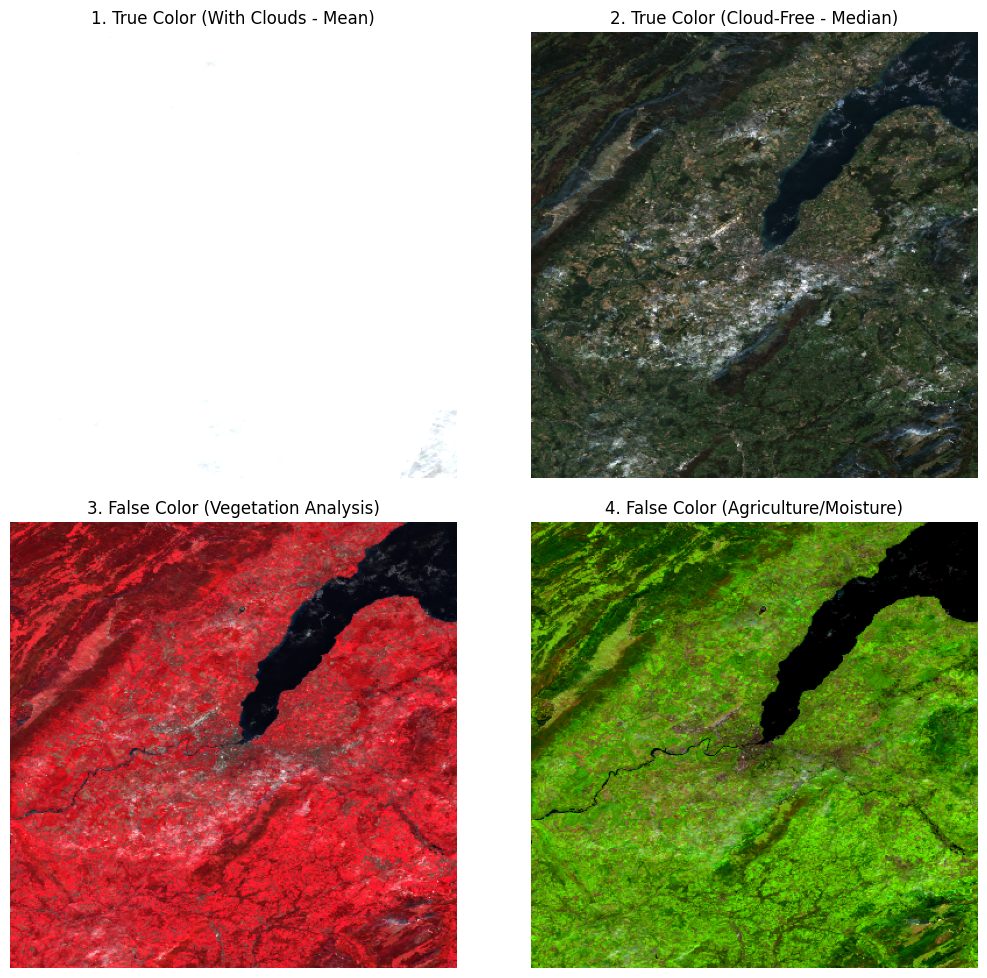

In [19]:
# --- Sentinel-2 Multi-Modal Composite Preview Panel ---

# Base collection for the preview period
s2_collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                   .filterBounds(roi)
                   .filterDate(PREVIEW_START_DATE, PREVIEW_END_DATE))

# --- Modality 1: Composite with Clouds (Average State) ---
# .mean() will average all pixels, giving a good sense of the cloudy state
s2_cloudy_composite = s2_collection.mean().divide(10000)

# --- Modality 2: Cloud-Free Composite (Median Filtered) ---
def mask_s2_clouds(image):
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000)

s2_cloudfree_composite = s2_collection.map(mask_s2_clouds).median()

# --- Modality 3 & 4: False-Color Composites (from the cloud-free image) ---
# These highlight features not visible to the naked eye.

# Prepare the lists for the plotting function
images_to_plot = [
    s2_cloudy_composite,         # Image 1
    s2_cloudfree_composite,      # Image 2
    s2_cloudfree_composite,      # Image 3 (using the same cloud-free base)
    s2_cloudfree_composite       # Image 4 (using the same cloud-free base)
]

titles_to_plot = [
    '1. True Color (With Clouds - Mean)',
    '2. True Color (Cloud-Free - Median)',
    '3. False Color (Vegetation Analysis)',
    '4. False Color (Agriculture/Moisture)'
]

# Define visualization parameters for each image
vis_params_to_plot = [
    # 1. True Color (B4=Red, B3=Green, B2=Blue)
    {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 0.3},

    # 2. True Color (B4=Red, B3=Green, B2=Blue)
    {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 0.3},

    # 3. False Color for Vegetation (B8=NIR, B4=Red, B3=Green)
    # Healthy vegetation reflects a lot of Near-infrared (NIR), so it appears red.
    {'bands': ['B8', 'B4', 'B3'], 'min': 0, 'max': 0.4},

    # 4. False Color for Agriculture (B11=SWIR1, B8=NIR, B4=Red)
    # Good for monitoring crop health and soil moisture. Water appears very dark.
    {'bands': ['B11', 'B8', 'B4'], 'min': 0.05, 'max': 0.5}
]

print(f"Generating Sentinel-2 multi-modal preview panel for {PREVIEW_START_DATE} to {PREVIEW_END_DATE}...")

# Plot the 2x2 panel
plot_composite_panel(images_to_plot, titles_to_plot, vis_params_to_plot, grid_dims=(2, 2))

Visualizing Topographical Features for the Geneva Region...


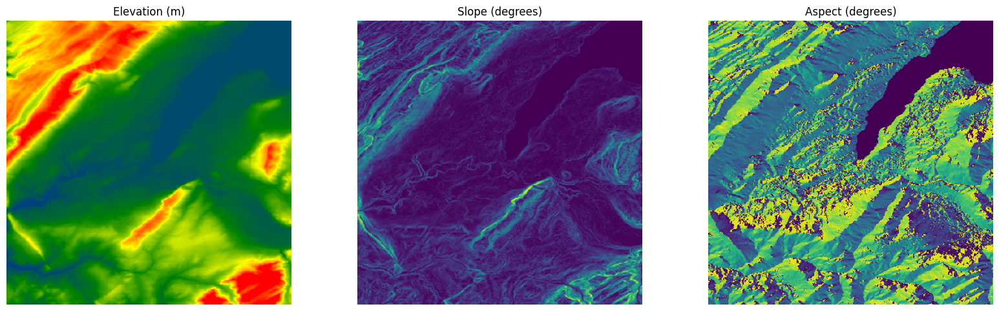

In [20]:
# --- Add Topography as a Static Feature Layer ---

# 1. Get the SRTM Digital Elevation Model (30m resolution)
dem = ee.Image('USGS/SRTMGL1_003')

# 2. Calculate Slope and Aspect
terrain = ee.Terrain.products(dem)
elevation = terrain.select('elevation')
slope = terrain.select('slope')
aspect = terrain.select('aspect')

# --- Visualize these new features ---
dem_vis = {'min': 100, 'max': 1500, 'palette': ['blue', 'green', 'yellow', 'red']}
print("Visualizing Topographical Features for the Geneva Region...")

plot_composite_panel(
    images=[elevation, slope, aspect],
    titles=['Elevation (m)', 'Slope (degrees)', 'Aspect (degrees)'],
    vis_params_list=[dem_vis, {'min': 0, 'max': 60}, {'min': 0, 'max': 360}],
    grid_dims=(1, 3)
)

# In your final data generation, you would add these bands to every image.
# For example: final_image = s2_composite.addBands([elevation, slope, aspect])

### DOWNLOAD TO LOCAL ENV

⚠ **WARNING**: If you have a need that downloading multiple datasets of more than a city. Just make sure that your parameters are looped and redefined above.

In [23]:
# RUN to Download

In [25]:
# import pkgs & define essential parameters.

import pandas as pd
import time

# >>> time step set: choose a.week / b.day / c.month {e.g. 'week'}
TIME_STEP_UNIT = 'week'

print(f'\n Sentinel Imagery Dataset has been allocated by per {TIME_STEP_UNIT} for its time step.')


 Sentinel Imagery Dataset has been allocated by per week for its time step.


**PIXEL** IS DEFINE HERE, inside the function. **Units**: meters.

In [30]:
def download_gee_image(image, filename, path, roi):
    """一个健壮的帮助函数，用于下载单个GEE图像。"""
    try:
        # 准备下载链接
        url = image.toFloat().getDownloadURL({
            'name': filename,
            'scale': 50,  # 建议使用30米分辨率以平衡细节和文件大小
            'region': roi,
            'format': 'GEO_TIFF'
        })

        # 使用 requests 下载
        response = requests.get(url, stream=True)
        response.raise_for_status()

        filepath = os.path.join(path, filename)
        with open(filepath, "wb") as f:
            for chunk in response.iter_content(chunk_size=1024*1024):
                if chunk:
                    f.write(chunk)
        return True, filename
    except Exception as e:
        # 如果某个时间步没有图像或出错，则打印信息
        print(f"Could not download {filename}. Reason: {e}")
        return False, str(e)

# --- 1. 下载静态地形数据 (只执行一次) ---
print("Processing static topographical data...")
dem = ee.Image('USGS/SRTMGL1_003')
terrain = ee.Terrain.products(dem)
dem_stack = terrain.select(['elevation', 'slope', 'aspect']).rename(['DEM', 'Slope', 'Aspect'])
success, msg = download_gee_image(dem_stack, 'Static_Topography.tif', DATASET_PATH, roi)
if success:
    print("Successfully downloaded Static_Topography.tif")
else:
    print(f"Failed to download static data. Reason: {msg}")
print("-" * 50)


# --- 2. 循环下载动态的时间序列数据 ---
print(f"Starting to process time series data by '{TIME_STEP_UNIT}'...")

# 生成时间序列的起始点
if TIME_STEP_UNIT.lower() == 'day':
    freq_code = 'D'
elif TIME_STEP_UNIT.lower() == 'week':
    # W-{MON, TUE, etc.} sets the start of the week
    freq_code = f'W-{pd.to_datetime(DOWNLOAD_START_DATE).day_name()[:3].upper()}'
elif TIME_STEP_UNIT.lower() == 'month':
    freq_code = 'MS' # MS for Month Start
else:
    raise ValueError("TIME_STEP_UNIT must be 'day', 'week', or 'month'")

date_range = pd.date_range(start=DOWNLOAD_START_DATE, end=DOWNLOAD_END_DATE, freq=freq_code)

for i in tqdm(range(len(date_range) - 1), desc="Processing Time Steps"):
    start_date = date_range[i].strftime('%Y-%m-%d')
    end_date = date_range[i+1].strftime('%Y-%m-%d')

    print(f"\nProcessing period: {start_date} to {end_date}")

    # --- 处理并下载哨兵1号数据 ---
    s1_collection = (ee.ImageCollection('COPERNICUS/S1_GRD')
                     .filterBounds(roi)
                     .filterDate(start_date, end_date)
                     .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
                     .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH')))

    if s1_collection.size().getInfo() > 0:
        s1_mean = s1_collection.select(['VV', 'VH']).mean()
        s1_ratio = s1_mean.select('VV').divide(s1_mean.select('VH')).rename('VV_VH_Ratio')
        s1_stack = s1_mean.addBands(s1_ratio)

        s1_filename = f"S1_Features_{start_date}.tif"
        success, msg = download_gee_image(s1_stack, s1_filename, DATASET_PATH, roi)
        if success:
            print(f"Downloaded {msg}")
        else:
            print(f"Failed for S1 on {start_date}. Reason: {msg}")
    else:
        print(f"No Sentinel-1 data for period starting {start_date}")

    # --- 处理并下载哨兵2号数据 ---
    s2_collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                     .filterBounds(roi)
                     .filterDate(start_date, end_date))

    if s2_collection.size().getInfo() > 0:
        s2_median_masked = s2_collection.map(mask_s2_clouds).median()
        # 选择核心数据波段
        s2_bands = s2_median_masked.select(['B2', 'B3', 'B4', 'B8', 'B11', 'B12'])
        # 计算NDVI并加入
        s2_ndvi = s2_median_masked.normalizedDifference(['B8', 'B4']).rename('NDVI')
        s2_stack = s2_bands.addBands(s2_ndvi)

        s2_filename = f"S2_Features_{start_date}.tif"
        success, msg = download_gee_image(s2_stack, s2_filename, DATASET_PATH, roi)
        if success:
            print(f"Downloaded {msg}")
        else:
            print(f"Failed for S2 on {start_date}. Reason: {msg}")
    else:
        print(f"No Sentinel-2 data for period starting {start_date}")

    # 增加一个小的延时避免请求过于频繁
    time.sleep(0.5)

print("\n--- All download tasks are complete. ---")
print(f"Data saved in: {DATASET_PATH}")

Processing static topographical data...
Successfully downloaded Static_Topography.tif
--------------------------------------------------
Starting to process time series data by 'week'...


Processing Time Steps:   0%|          | 0/14 [00:00<?, ?it/s]


Processing period: 2024-09-01 to 2024-09-08
Downloaded S1_Features_2024-09-01.tif
Downloaded S2_Features_2024-09-01.tif

Processing period: 2024-09-08 to 2024-09-15
Downloaded S1_Features_2024-09-08.tif
Downloaded S2_Features_2024-09-08.tif

Processing period: 2024-09-15 to 2024-09-22
Downloaded S1_Features_2024-09-15.tif
Downloaded S2_Features_2024-09-15.tif

Processing period: 2024-09-22 to 2024-09-29
Downloaded S1_Features_2024-09-22.tif
Downloaded S2_Features_2024-09-22.tif

Processing period: 2024-09-29 to 2024-10-06
Downloaded S1_Features_2024-09-29.tif
Downloaded S2_Features_2024-09-29.tif

Processing period: 2024-10-06 to 2024-10-13
Downloaded S1_Features_2024-10-06.tif
Downloaded S2_Features_2024-10-06.tif

Processing period: 2024-10-13 to 2024-10-20
Downloaded S1_Features_2024-10-13.tif
Downloaded S2_Features_2024-10-13.tif

Processing period: 2024-10-20 to 2024-10-27
Downloaded S1_Features_2024-10-20.tif
Downloaded S2_Features_2024-10-20.tif

Processing period: 2024-10-27 t

### PREVIEW LOCALLY

In [31]:
# Preview fetched localhost Dataset. Check the usability of it.
!pip install rasterio --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 75.0 MB/s eta 0:00:00


In [36]:
import matplotlib.pyplot as plt
import rasterio
import numpy as np
import glob
import os

DATA_PATH = "/content/dataset/geneva" # Manually Set, for its accurancy.
TOPO_FILE_PATH = os.path.join(DATA_PATH, "Static_Topography.tif") # terrain photograph.

# Find and chronologically sort the downloaded feature files.
s1_files = sorted(glob.glob(os.path.join(DATA_PATH, "S1_Features_*.tif")))
s2_files = sorted(glob.glob(os.path.join(DATA_PATH, "S2_Features_*.tif")))

num_to_plot = min(7, len(s1_files), len(s2_files))

print(f'your local dataset is set manually to {DATA_PATH}. ')

your local dataset is set manually to /content/dataset/geneva. 


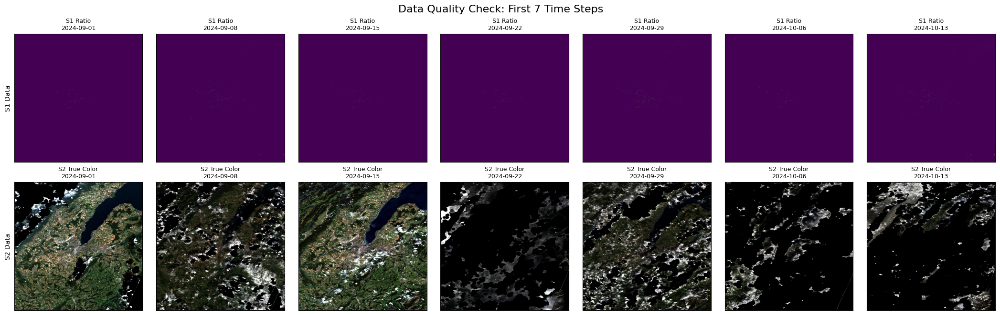

In [34]:
if num_to_plot == 0:
    print(f"No files found in {DATA_PATH} to visualize.")
else:
    # Create the 2x7 subplot grid. constrained_layout helps prevent titles from overlapping.
    fig, axes = plt.subplots(2, num_to_plot, figsize=(21, 6.5), constrained_layout=True)
    fig.suptitle("Data Quality Check: First {} Time Steps".format(num_to_plot), fontsize=16)

    def normalize_for_display(band_data, p_low=2, p_high=98):
        """Stretches raw data to a 0-1 range for better visual contrast."""
        low, high = np.percentile(band_data[np.isfinite(band_data)], (p_low, p_high))
        if high - low > 0:
            return np.clip((band_data - low) / (high - low), 0, 1)
        return np.zeros_like(band_data)

    for i in range(num_to_plot):
        # Handle indexing for single column case
        ax_s1 = axes[0, i] if num_to_plot > 1 else axes[0]
        ax_s2 = axes[1, i] if num_to_plot > 1 else axes[1]

        # --- Top Row: Sentinel-1 Ratio ---
        with rasterio.open(s1_files[i]) as src:
            # The 3rd band in our S1 file is the VV/VH Ratio.
            s1_ratio = src.read(3)
            ax_s1.imshow(s1_ratio, cmap='viridis', vmin=1, vmax=6)
            # Use the date from the filename for a concise title.
            date = os.path.basename(s1_files[i]).split('_')[-1].replace('.tif', '')
            ax_s1.set_title(f"S1 Ratio\n{date}", fontsize=9)

        # --- Bottom Row: Sentinel-2 True Color ---
        with rasterio.open(s2_files[i]) as src:
            # Our S2 files are stacked as [B2, B3, B4, ...].
            # We read bands 3(B4), 2(B3), and 1(B2) for an R,G,B image.
            r = src.read(3)
            g = src.read(2)
            b = src.read(1)

            # Normalize each band and stack them into an RGB array.
            s2_rgb = np.dstack((normalize_for_display(r),
                                normalize_for_display(g),
                                normalize_for_display(b)))
            ax_s2.imshow(s2_rgb)
            ax_s2.set_title(f"S2 True Color\n{date}", fontsize=9)

    # Clean up axes for a tidy academic look.
    for ax in axes.flatten():
        ax.set_xticks([])
        ax.set_yticks([])

    # Set axis labels only on the very first plot of each row.
    ax0 = axes[0, 0] if num_to_plot > 1 else axes[0]
    ax1 = axes[1, 0] if num_to_plot > 1 else axes[1]
    ax0.set_ylabel("S1 Data", fontsize=10)
    ax1.set_ylabel("S2 Data", fontsize=10)

    plt.show()

What's more, check additional data bands.

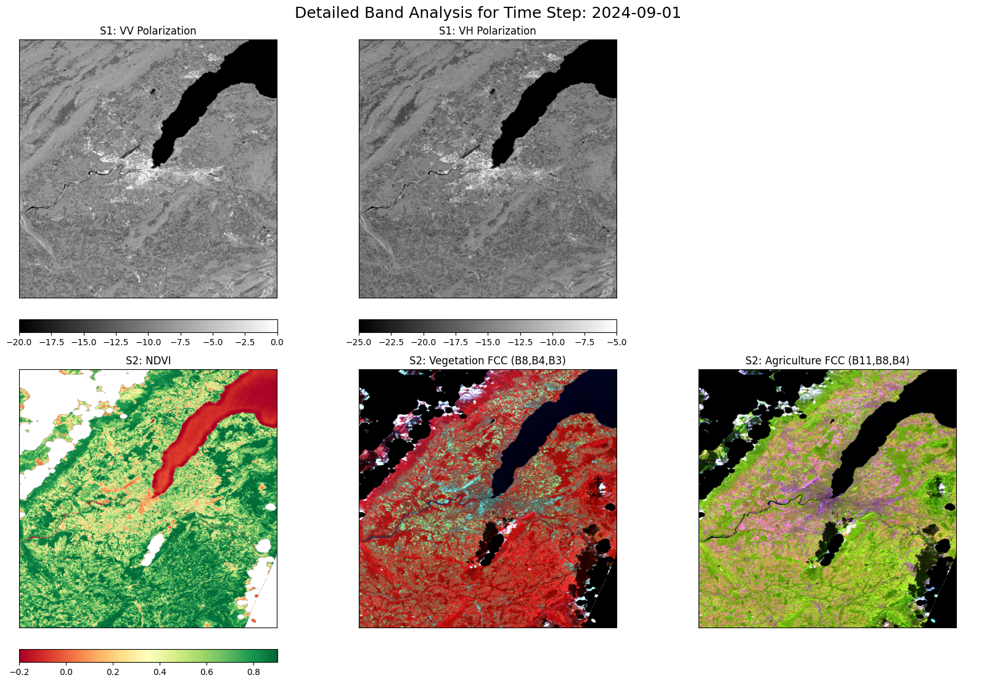

In [38]:
if num_to_plot > 0:
    s1_file_example = s1_files[0]
    s2_file_example = s2_files[0]

    # Create a 2x3 subplot grid for a detailed view.
    with rasterio.Env(CPL_LOG_LEVEL='ERROR'):
      fig, axes = plt.subplots(2, 3, figsize=(16.5, 11), constrained_layout=True)
      date = os.path.basename(s1_file_example).split('_')[-1].replace('.tif', '')
      fig.suptitle(f"Detailed Band Analysis for Time Step: {date}", fontsize=18)

      # --- Row 1: Visualizing Sentinel-1 Bands ---
      with rasterio.open(s1_file_example) as src:
          # Band 1: VV Polarization
          s1_vv = src.read(1)
          ax_vv = axes[0, 0]
          im_vv = ax_vv.imshow(s1_vv, cmap='gray', vmin=-20, vmax=0)
          ax_vv.set_title("S1: VV Polarization", fontsize=12)
          fig.colorbar(im_vv, ax=ax_vv, orientation='horizontal', pad=0.08, fraction=0.05)

          # Band 2: VH Polarization
          s1_vh = src.read(2)
          ax_vh = axes[0, 1]
          im_vh = ax_vh.imshow(s1_vh, cmap='gray', vmin=-25, vmax=-5)
          ax_vh.set_title("S1: VH Polarization", fontsize=12)
          fig.colorbar(im_vh, ax=ax_vh, orientation='horizontal', pad=0.08, fraction=0.05)

          # Hide the last subplot in the first row for alignment.
          axes[0, 2].set_axis_off()

      # --- Row 2: Visualizing Sentinel-2 Derived Products ---
      with rasterio.open(s2_file_example) as src:
          # Band 7: NDVI (Normalized Difference Vegetation Index)
          s2_ndvi = src.read(7)
          ax_ndvi = axes[1, 0]
          im_ndvi = ax_ndvi.imshow(s2_ndvi, cmap='RdYlGn', vmin=-0.2, vmax=0.9)
          ax_ndvi.set_title("S2: NDVI", fontsize=12)
          fig.colorbar(im_ndvi, ax=ax_ndvi, orientation='horizontal', pad=0.08, fraction=0.05)

          # Vegetation False Color (B8, B4, B3)
          b8, b4, b3 = src.read(4), src.read(3), src.read(1)
          veg_fcc = np.dstack((normalize_for_display(b8),
                              normalize_for_display(b4),
                              normalize_for_display(b3)))
          ax_veg = axes[1, 1]
          ax_veg.imshow(veg_fcc)
          ax_veg.set_title("S2: Vegetation FCC (B8,B4,B3)", fontsize=12)

          # Agriculture/Moisture False Color (B11, B8, B4)
          b11 = src.read(5)
          agri_fcc = np.dstack((normalize_for_display(b11),
                                normalize_for_display(b8),
                                normalize_for_display(b4)))
          ax_agri = axes[1, 2]
          ax_agri.imshow(agri_fcc)
          ax_agri.set_title("S2: Agriculture FCC (B11,B8,B4)", fontsize=12)

      # Clean up all axes for a final look.
      for ax in axes.flatten():
          ax.set_xticks([])
          ax.set_yticks([])

      plt.show()

else:
    print("No files were previously found to generate a detailed view.")

for the terrain checking, we do run the code block below.

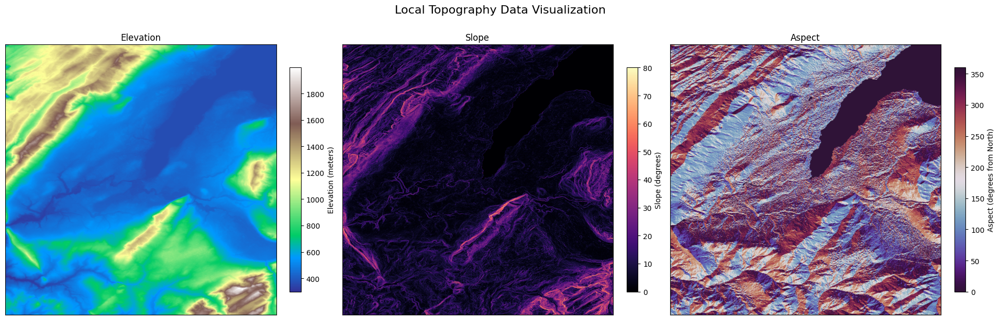

In [37]:
if not os.path.exists(TOPO_FILE_PATH):
    print(f"Error: Topography file not found at '{TOPO_FILE_PATH}'")
    print("Please ensure the download script has run successfully and the file exists.")
else:
    # 创建一个1x3的子图网格
    fig, axes = plt.subplots(1, 3, figsize=(19, 6.5), constrained_layout=True)
    fig.suptitle("Local Topography Data Visualization", fontsize=16)

    with rasterio.open(TOPO_FILE_PATH) as src:
        # --- 子图 1: Elevation (高程) ---
        # 我们下载的文件中，第1个波段是高程
        elevation = src.read(1)
        ax_elev = axes[0]
        # 使用 'terrain' 色图来显示高程
        im_elev = ax_elev.imshow(elevation, cmap='terrain')
        fig.colorbar(im_elev, ax=ax_elev, shrink=0.7).set_label('Elevation (meters)')
        ax_elev.set_title("Elevation")

        # --- 子图 2: Slope (坡度) ---
        # 第2个波段是坡度
        slope = src.read(2)
        ax_slope = axes[1]
        # 使用 'magma' 色图显示坡度，从黑到亮黄
        im_slope = ax_slope.imshow(slope, cmap='magma')
        fig.colorbar(im_slope, ax=ax_slope, shrink=0.7).set_label('Slope (degrees)')
        ax_slope.set_title("Slope")

        # --- 子图 3: Aspect (坡向) ---
        # 第3个波段是坡向
        aspect = src.read(3)
        ax_aspect = axes[2]
        # 使用 'twilight_shifted' 循环色图来显示0-360度的坡向
        im_aspect = ax_aspect.imshow(aspect, cmap='twilight_shifted', vmin=0, vmax=360)
        fig.colorbar(im_aspect, ax=ax_aspect, shrink=0.7).set_label('Aspect (degrees from North)')
        ax_aspect.set_title("Aspect")

    # 为所有子图移除坐标轴刻度，保持整洁
    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()

In [ ]:
# --- Create a ZIP archive of the downloaded dataset ---

In [39]:
print("Preparing to package downloaded files...")

output_zip_basename = f"/content/{CITY_NAME.replace(' ', '_')}_{DOWNLOAD_START_DATE}_to_{DOWNLOAD_END_DATE}_Dataset"

if os.path.isdir(DATASET_PATH) and len(os.listdir(DATASET_PATH)) > 0:
    print(f"Source directory '{DATASET_PATH}' found with {len(os.listdir(DATASET_PATH))} files.")
    print("Creating ZIP archive, this may take a moment...")

    try:
        # arg: shutil.make_archive('输出文件名(无扩展名)', '压缩格式', '要压缩的目录')
        final_zip_path = shutil.make_archive(
            base_name=output_zip_basename,
            format='zip',
            root_dir=DATASET_PATH
        )

        print(f"Successfully created ZIP file: {os.path.basename(final_zip_path)}")
        print(f"\nLocation: {final_zip_path}")

    except Exception as e:
        print(f"An error occurred during the zipping process: {e}")

else:
    print(f"Skipping packaging. Source directory '{DATASET_PATH}' either does not exist or is empty.")
    print("Please ensure the download script has run successfully and generated files.")

Preparing to package downloaded files...
Source directory '/content/dataset/geneva' found with 29 files.
Creating ZIP archive, this may take a moment...
Successfully created ZIP file: geneva_2024-09-01_to_2024-12-10_Dataset.zip

Location: /content/geneva_2024-09-01_to_2024-12-10_Dataset.zip


And Check the File Window in left side, click download.

Thus, Datasets could be used or trained offline at localhost.



```
Dalian Neusoft University of Information, Dalian, China.
Last Edited: 28th, June, 2025.
Copyright © 2025 Jindong Fan (Sylvester Van), undergraduate & ra, datasci 23102.
contact at naringinstudio@outlook.com, 2323450016@dnui.edu.cn (expired at 2026.4)
page: https://sylvestervan.github.io

The MIT License (MIT).
Duplication are authorized in the condition of announcing source & author.
https://mit-license.org/

Additionally, the Learner are supposed to allow the Copernicus Project,
Sentinel Data Terms and Conditions if the one use the imagery.
https://sentinels.copernicus.eu/terms-conditions
```

